In [1]:
import pandas as pd
import numpy as np
import random
import scipy.stats as stats
from scipy.stats import mannwhitneyu
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, classification_report
from sklearn.model_selection import cross_val_score
import seaborn as sns
from sklearn.metrics import mean_absolute_error
import statsmodels.api as sm
import matplotlib.pyplot as plt
from scipy.stats import pearsonr
from scipy.stats import ttest_ind
from sklearn.impute import SimpleImputer
import scipy.stats as stats
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, roc_curve, roc_auc_score
from sklearn import datasets
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn import metrics
from sklearn.metrics import silhouette_samples
from sklearn.cluster import DBSCAN
from scipy.special import expit # 
from scipy.stats import ttest_ind, f_oneway
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler

In [2]:
# Seed the random number generator with my N-number
seed_num = np.random.seed(16284294)  #The number is supposed to be my specific N-number

# Data Preparation and Exploratory Data Analysis

In [3]:
# Data Preparation - Loading the Dataset
# Load the dataset
data = pd.read_csv('spotify52kData.csv', delimiter=',')

In [4]:
#Exploratory Data Analysis (EDA)
# Get a sense of the dataset's structure
print("Number of rows and columns:", data.shape)

Number of rows and columns: (52000, 20)


In [5]:
# Display the first few rows of the dataset
print("First few rows of the dataset:")
data.head()

First few rows of the dataset:


,songNumber,artists,album_name,track_name,popularity,duration,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,0,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,acoustic
1,1,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,acoustic
2,2,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,acoustic
3,3,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,acoustic
4,4,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4,acoustic


In [6]:
# Get information about data types and missing values
print("Data types and missing values:")
data.info()

Data types and missing values:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52000 entries, 0 to 51999
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   songNumber        52000 non-null  int64  
 1   artists           52000 non-null  object 
 2   album_name        52000 non-null  object 
 3   track_name        52000 non-null  object 
 4   popularity        52000 non-null  int64  
 5   duration          52000 non-null  int64  
 6   explicit          52000 non-null  bool   
 7   danceability      52000 non-null  float64
 8   energy            52000 non-null  float64
 9   key               52000 non-null  int64  
 10  loudness          52000 non-null  float64
 11  mode              52000 non-null  int64  
 12  speechiness       52000 non-null  float64
 13  acousticness      52000 non-null  float64
 14  instrumentalness  52000 non-null  float64
 15  liveness          52000 non-null  float64
 16  valence  

In [7]:
# Summary statistics for numeric columns
print("Summary statistics for numeric columns:")
data.describe()

Summary statistics for numeric columns:


,songNumber,popularity,duration,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
count,52000.000000,52000.000000,5.200000e+04,52000.000000,52000.000000,52000.000000,52000.000000,52000.000000,52000.000000,52000.000000,52000.000000,52000.000000,52000.000000,52000.000000,52000.000000
mean,25999.500000,33.115923,2.302998e+05,0.563900,0.668259,5.348442,-7.972804,0.622904,0.095864,0.271442,0.182884,0.212527,0.451814,123.558120,3.916308
std,15011.251336,21.743697,1.176823e+05,0.176573,0.249585,3.562600,4.919127,0.484664,0.131501,0.322322,0.325275,0.187986,0.255314,29.242142,0.400671
min,0.000000,0.000000,1.745300e+04,0.000000,0.000020,0.000000,-42.044000,0.000000,0.000000,0.000000,0.000000,0.011200,0.000000,0.000000,0.000000
25%,12999.750000,18.000000,1.739470e+05,0.447000,0.508000,2.000000,-9.578000,0.000000,0.036800,0.007260,0.000000,0.097200,0.238000,100.979000,4.000000
50%,25999.500000,33.000000,2.135460e+05,0.574000,0.717000,6.000000,-6.696000,1.000000,0.051200,0.106000,0.000161,0.132000,0.431000,123.366000,4.000000
75%,38999.250000,50.000000,2.651962e+05,0.696000,0.877000,9.000000,-4.849000,1.000000,0.093000,0.499000,0.168000,0.275000,0.653000,141.944000,4.000000
max,51999.000000,100.000000,4.789026e+06,0.983000,1.000000,11.000000,4.532000,1.000000,0.965000,0.996000,0.997000,0.995000,0.995000,243.372000,5.000000


In [8]:
# Recognize how many duplicate songs there are that are under different albums

# Identify duplicate track names
duplicate_tracks = data[data.duplicated(subset='track_name', keep=False)]

# Print count and names of duplicate track names
if not duplicate_tracks.empty:
    print(f"Number of Duplicate Track Names: {len(duplicate_tracks)}")
    print("Duplicate Track Names:")
    print(duplicate_tracks['track_name'].unique())
else:
    print("No duplicate track names found.")


Number of Duplicate Track Names: 20475
Duplicate Track Names:
['Ghost - Acoustic' "Can't Help Falling In Love" 'Hold On' ...
 'Pobre Diabla' 'Least Ian Lie' 'Dale Don Dale']


In [9]:
# Duplicate songs
duplicate_songs = data[data.duplicated(subset='track_name', keep=False)]

# Display the values of 'duration', 'danceability', 'energy', 'loudness', 'speechiness', 
# and 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', and 'popularity' 
# for the duplicate tracks

for track_name in duplicate_songs['track_name'].unique():
    duplicate_entries = data[data['track_name'] == track_name]
    
    print(f"\nTrack Name: {track_name}\n")
    for _, entry in duplicate_entries.iterrows():
        print(f"Album Name: {entry['album_name']}")
        print(f"Duration: {entry['duration']}")
        print(f"Danceability: {entry['danceability']}")
        print(f"Explicit: {entry['explicit']}")
        print(f"Energy: {entry['energy']}")
        print(f"Mode: {entry['mode']}")
        print(f"Track Genre: {entry['track_genre']}")
        print(f"Key: {entry['key']}")
        print(f"Loudness: {entry['loudness']}")
        print(f"Speechiness: {entry['speechiness']}")
        print(f"Acousticness: {entry['acousticness']}")
        print(f"Instrumentalness: {entry['instrumentalness']}")
        print(f"Liveness: {entry['liveness']}")
        print(f"Valence: {entry['valence']}")
        print(f"Tempo: {entry['tempo']}")
        print(f"Popularity: {entry['popularity']}\n")



Track Name: Ghost - Acoustic

Album Name: Ghost (Acoustic)
Duration: 149610
Danceability: 0.42
Explicit: False
Energy: 0.166
Mode: 1
Track Genre: acoustic
Key: 1
Loudness: -17.235
Speechiness: 0.0763
Acousticness: 0.924
Instrumentalness: 5.56e-06
Liveness: 0.101
Valence: 0.267
Tempo: 77.489
Popularity: 55

Album Name: Ghost - Acoustic
Duration: 155050
Danceability: 0.486
Explicit: False
Energy: 0.0745
Mode: 1
Track Genre: acoustic
Key: 10
Loudness: -14.271
Speechiness: 0.0599
Acousticness: 0.922
Instrumentalness: 0.0
Liveness: 0.104
Valence: 0.396
Tempo: 145.912
Popularity: 42

Album Name: Ghost (Acoustic)
Duration: 149610
Danceability: 0.42
Explicit: False
Energy: 0.166
Mode: 1
Track Genre: chill
Key: 1
Loudness: -17.235
Speechiness: 0.0763
Acousticness: 0.924
Instrumentalness: 5.56e-06
Liveness: 0.101
Valence: 0.267
Tempo: 77.489
Popularity: 55


Track Name: Can't Help Falling In Love

Album Name: Crazy Rich Asians (Original Motion Picture Soundtrack)
Duration: 201933
Danceability: 

In [10]:
# Filter out the duplicate songs based on duration
# Why duration? Because even though two songs with the same name that are on different albums may be considered the same,
# they may be covers of the original song, which may have different tempos, instruments, loudness values even though they 
# are the same song, or have the same song title

# For example, for the song titled Lucky originally by Jason Mraz, Lucky may be on different albums with him singing, 
# which would make it so that it has the same duration of the song, but if Glee members sang Lucky, they might sing
# quieter or louder, longer or shorter, and/or use different insrtuments to perform the song, even though it's the same song
# Because of this, the song Glee performs might be longer or shorter depending on what they do than in the original song 
# Therefore, duration is a good way of determining which duplicates are best to drop without doing it mindlessly, by just dropping ALL duplicates
'''Album Name: We Sing. We Dance. We Steal Things.
Duration: 189613
Danceability: 0.625
Energy: 0.414
Loudness: -8.7
Speechiness: 0.0369
Acousticness: 0.294
Instrumentalness: 0.0
Liveness: 0.151
Valence: 0.669
Tempo: 130.088
Popularity: 74

vs. 

Album Name: Glee: The Music, Volume 4
Duration: 187560
Danceability: 0.632
Energy: 0.468
Loudness: -8.089
Speechiness: 0.0412
Acousticness: 0.541
Instrumentalness: 0.0
Liveness: 0.165
Valence: 0.669
Tempo: 130.052
Popularity: 49
'''
#Newly updated data
data = data.drop_duplicates(subset=['track_name', 'duration'], keep='first')
# Display the DataFrame with unique songs
print("\nDataFrame with Unique Songs:")
print(data)


DataFrame with Unique Songs:
       songNumber                                     artists  \
0               0                                 Gen Hoshino   
1               1                                Ben Woodward   
2               2                      Ingrid Michaelson;ZAYN   
3               3                                Kina Grannis   
4               4                            Chord Overstreet   
...           ...                                         ...   
51993       51993                                    Don Omar   
51994       51994                                    Don Omar   
51995       51995                        Don Omar;Trebol Clan   
51998       51998  Moneybagg Yo;Pooh Shiesty;Lil Durk;EST Gee   
51999       51999                         Don Omar;Juan Magán   

                                              album_name  \
0                                                 Comedy   
1                                       Ghost (Acoustic)   
2        

In [11]:
# Identify remaining duplicate track names
duplicate_tracks = data[data.duplicated(subset='track_name', keep=False)]

# Print count and names of duplicate track names
if not duplicate_tracks.empty:
    print(f"Number of Duplicate Track Names Now: {len(duplicate_tracks)}")
    print("Duplicate Track Names:")
    print(duplicate_tracks['track_name'].unique())
else:
    print("No duplicate track names found.")

Number of Duplicate Track Names Now: 6527
Duplicate Track Names:
['Ghost - Acoustic' "Can't Help Falling In Love" 'Hold On' ...
 'MONTERO (Call Me By Your Name)'
 'Why This Kolaveri Di? - The Soup of Love' 'Goat']


In [12]:
# This is great because we reasonably reduced the number of duplicate songs in the data from 20,475 to 6,527 
# which is already better than what we had originally with the data

In [13]:
# Identify duplicate songs
duplicate_songs = data[data.duplicated(subset='track_name', keep=False)]

# Display the values of 'duration', 'danceability', 'energy', 'loudness', 'speechiness', 
# and 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo for the duplicate tracks
for track_name in duplicate_songs['track_name'].unique():
    duplicate_entries = data[data['track_name'] == track_name]
    
    print(f"\nTrack Name: {track_name}\n")
    
    for _, entry in duplicate_entries.iterrows():
        print(f"Album Name: {entry['album_name']}")
        print(f"Duration: {entry['duration']}")
        print(f"Danceability: {entry['danceability']}")
        print(f"Explicit: {entry['explicit']}")
        print(f"Energy: {entry['energy']}")
        print(f"Mode: {entry['mode']}")
        print(f"Track Genre: {entry['track_genre']}")
        print(f"Key: {entry['key']}")
        print(f"Loudness: {entry['loudness']}")
        print(f"Speechiness: {entry['speechiness']}")
        print(f"Acousticness: {entry['acousticness']}")
        print(f"Instrumentalness: {entry['instrumentalness']}")
        print(f"Liveness: {entry['liveness']}")
        print(f"Valence: {entry['valence']}")
        print(f"Tempo: {entry['tempo']}")
        print(f"Popularity: {entry['popularity']}\n")


Track Name: Ghost - Acoustic

Album Name: Ghost (Acoustic)
Duration: 149610
Danceability: 0.42
Explicit: False
Energy: 0.166
Mode: 1
Track Genre: acoustic
Key: 1
Loudness: -17.235
Speechiness: 0.0763
Acousticness: 0.924
Instrumentalness: 5.56e-06
Liveness: 0.101
Valence: 0.267
Tempo: 77.489
Popularity: 55

Album Name: Ghost - Acoustic
Duration: 155050
Danceability: 0.486
Explicit: False
Energy: 0.0745
Mode: 1
Track Genre: acoustic
Key: 10
Loudness: -14.271
Speechiness: 0.0599
Acousticness: 0.922
Instrumentalness: 0.0
Liveness: 0.104
Valence: 0.396
Tempo: 145.912
Popularity: 42


Track Name: Can't Help Falling In Love

Album Name: Crazy Rich Asians (Original Motion Picture Soundtrack)
Duration: 201933
Danceability: 0.266
Explicit: False
Energy: 0.0596
Mode: 1
Track Genre: acoustic
Key: 0
Loudness: -18.515
Speechiness: 0.0363
Acousticness: 0.905
Instrumentalness: 7.07e-05
Liveness: 0.132
Valence: 0.143
Tempo: 181.74
Popularity: 71

Album Name: The Living Room Sessions Vol. 3
Duration: 1

In [14]:
data.info()
print("Number of rows and columns:", data.shape)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 42468 entries, 0 to 51999
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   songNumber        42468 non-null  int64  
 1   artists           42468 non-null  object 
 2   album_name        42468 non-null  object 
 3   track_name        42468 non-null  object 
 4   popularity        42468 non-null  int64  
 5   duration          42468 non-null  int64  
 6   explicit          42468 non-null  bool   
 7   danceability      42468 non-null  float64
 8   energy            42468 non-null  float64
 9   key               42468 non-null  int64  
 10  loudness          42468 non-null  float64
 11  mode              42468 non-null  int64  
 12  speechiness       42468 non-null  float64
 13  acousticness      42468 non-null  float64
 14  instrumentalness  42468 non-null  float64
 15  liveness          42468 non-null  float64
 16  valence           42468 non-null  float6

In [15]:
# Display the first few rows of the dataset
print("First few rows of the dataset:")
data.head()

First few rows of the dataset:


,songNumber,artists,album_name,track_name,popularity,duration,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,0,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,acoustic
1,1,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,acoustic
2,2,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,acoustic
3,3,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,acoustic
4,4,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4,acoustic


In [16]:
# Summary statistics for numeric columns
print("Summary statistics for numeric columns:")
data.describe()

Summary statistics for numeric columns:


,songNumber,popularity,duration,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
count,42468.000000,42468.000000,4.246800e+04,42468.000000,42468.000000,42468.000000,42468.000000,42468.000000,42468.000000,42468.000000,42468.000000,42468.000000,42468.000000,42468.000000,42468.000000
mean,25438.663888,34.837313,2.320089e+05,0.561739,0.666397,5.340421,-8.122840,0.623246,0.101096,0.280402,0.197082,0.216319,0.449462,123.811632,3.913770
std,15146.992990,19.782340,1.225808e+05,0.178197,0.253266,3.561414,4.949602,0.484578,0.141402,0.327094,0.334596,0.193249,0.257556,29.440448,0.412106
min,0.000000,0.000000,1.745300e+04,0.000000,0.000020,0.000000,-42.044000,0.000000,0.000000,0.000000,0.000000,0.011200,0.000000,0.000000,0.000000
25%,12266.750000,20.000000,1.738260e+05,0.444000,0.499000,2.000000,-9.867000,0.000000,0.036900,0.006480,0.000000,0.097600,0.234000,100.980000,4.000000
50%,24697.500000,34.000000,2.151495e+05,0.572000,0.715000,6.000000,-6.879000,1.000000,0.052000,0.112000,0.000264,0.132000,0.426000,123.740000,4.000000
75%,38708.250000,50.000000,2.680000e+05,0.696000,0.882000,9.000000,-4.915000,1.000000,0.097325,0.524000,0.257250,0.281000,0.652000,142.153250,4.000000
max,51999.000000,100.000000,4.789026e+06,0.983000,1.000000,11.000000,4.532000,1.000000,0.965000,0.996000,0.997000,0.995000,0.995000,243.372000,5.000000


In [17]:
# Convert DataFrame to NumPy array, in case needed
arr = data.values

# Question 1: Consider the 10 song features duration, danceability, energy, loudness, speechiness, acousticness, instrumentalness, liveness, valence and tempo. Is any of these features reasonably distributed normally? If so, which one?

# Distributions of Each of the 10 Features: 

The 10 Features are: Duration, Danceability, Energy, Loudness, Speechiness, Acousticness, Instrumentalness, Liveness, Valence, and Tempo. 

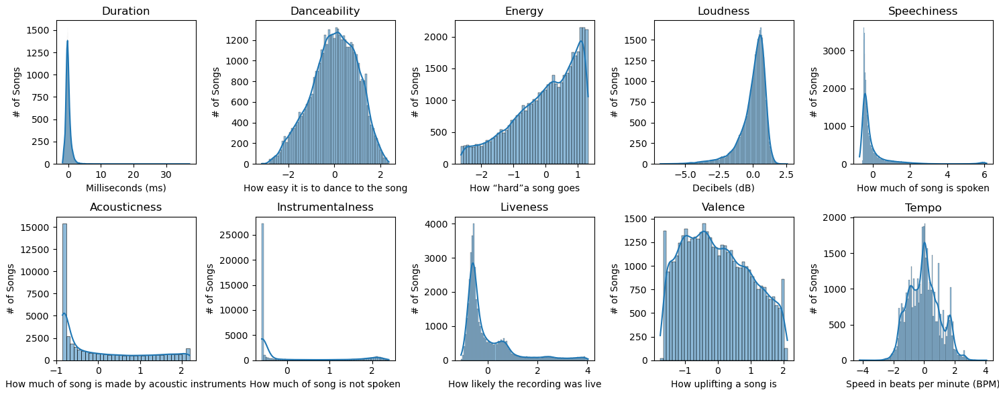

In [18]:
features = ['duration', 'danceability', 'energy', 'loudness', 'speechiness',
            'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo']

# Create a subset with the 10 song features
ten_features = data[features]

# Function for NaN removal on a specific subset of columns
def nanRemover(subset):
    return subset[~np.isnan(subset).any(axis=1)]

# NaN removal for the subset of features
subset_features_cleaned = nanRemover(ten_features)

# Set up a 2x5 grid for subplots
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(15, 6))

# Flatten the 2D array of axes to simplify indexing
axes = axes.flatten()

# Standardize the variables
scaler = StandardScaler()
ten_features_standardized = scaler.fit_transform(subset_features_cleaned)

# Create a DataFrame with standardized values
ten_features_standardized_df = pd.DataFrame(ten_features_standardized, columns=['duration', 'danceability', 'energy', 'loudness', 'speechiness',
            'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo'])

# Visualization of feature distributions
for i, feature in enumerate(features):
    sns.histplot(ten_features_standardized_df[feature], kde=True, ax=axes[i])
    
    if feature == 'duration':
        axes[0].set_xlabel('Milliseconds (ms)')
        axes[0].set_title('Duration')
        axes[0].set_ylabel('# of Songs')
    elif feature == 'danceability':
        axes[1].set_xlabel('How easy it is to dance to the song')
        axes[1].set_title('Danceability')
        axes[1].set_ylabel('# of Songs')
    elif feature == 'energy':
        axes[2].set_xlabel('How “hard”a song goes')
        axes[2].set_title('Energy')
        axes[2].set_ylabel('# of Songs')
    elif feature == 'loudness':
        axes[3].set_xlabel('Decibels (dB)')
        axes[3].set_title('Loudness')
        axes[3].set_ylabel('# of Songs')
    elif feature == 'speechiness':
        axes[4].set_xlabel('How much of song is spoken')
        axes[4].set_title('Speechiness')
        axes[4].set_ylabel('# of Songs')
    elif feature == 'acousticness':
        axes[5].set_xlabel('How much of song is made by acoustic instruments')
        axes[5].set_title('Acousticness')
        axes[5].set_ylabel('# of Songs')
    elif feature == 'instrumentalness':
        axes[6].set_xlabel('How much of song is not spoken')
        axes[6].set_title('Instrumentalness')
        axes[6].set_ylabel('# of Songs')
    elif feature == 'liveness':
        axes[7].set_xlabel('How likely the recording was live')
        axes[7].set_title('Liveness')
        axes[7].set_ylabel('# of Songs')
    elif feature == 'valence':
        axes[i].set_xlabel('How uplifting a song is')
        axes[i].set_title('Valence')
        axes[i].set_ylabel('# of Songs')
    elif feature == 'tempo':
        axes[i].set_xlabel('Speed in beats per minute (BPM)')
        axes[i].set_title('Tempo')
        axes[i].set_ylabel('# of Songs')
    else:
        axes[i].set_xlabel(feature)
        axes[i].set_title(feature)
        axes[i].set_ylabel('# of Songs')

plt.tight_layout()
plt.show()


Response to Question 1: Out of the 10 song features stated, I said that features that are the most normally distributed would be danceability and maybe tempo, but neither are perfectly normally distributed with danceability having a slight left skew. It is important to note that there is a possibility of the danceability and tempo feature to be more normally distributed if there was more data and more values, due to the combination of the ideas of the Law of Large Numbers and the Central Limit Theorem.

# Question 2: Is there a relationship between song length and popularity of a song? If so, if the relationship positive or negative?

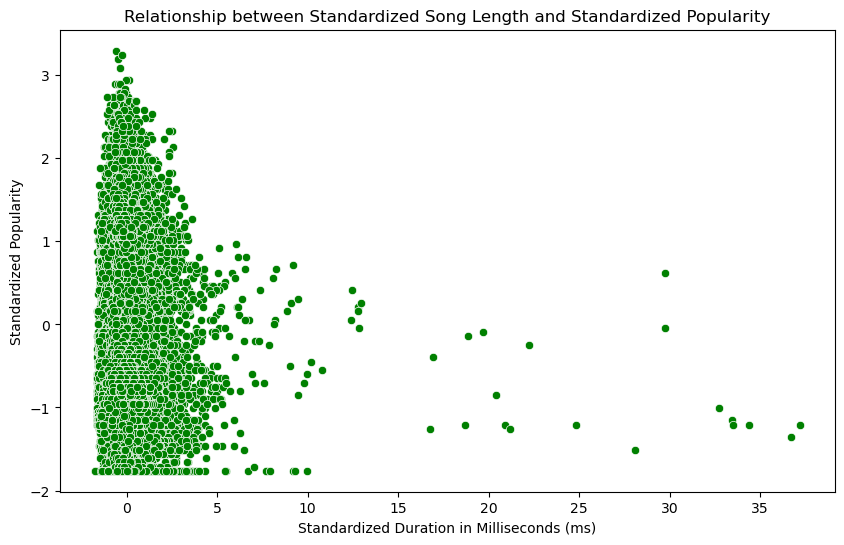

Spearman's Correlation Coefficient: -0.0948
Pearson's Correlation Coefficient: -0.0963


In [19]:
length_and_pop = ['duration', 'popularity']

# Create a subset with the song features for this question, which in this case is duration and popularity 
length_and_pop = data[length_and_pop]

# Function for NaN removal on a specific subset of columns, a.k.a duration and popularity
def nanRemover(subset):
    return subset[~np.isnan(subset).any(axis=1)]

# NaN removal for the duration and popularity columns
length_and_pop = nanRemover(length_and_pop)

# Standardize the variables (decided to do this with standardized variables so the scales are the same, so it can be interpretable
scaler = StandardScaler()
length_and_pop_standardized = scaler.fit_transform(length_and_pop)

# Create a DataFrame with standardized values
length_and_pop_standardized_df = pd.DataFrame(length_and_pop_standardized, columns=['duration', 'popularity'])

# Plot the scatterplot with standardized variables
plt.figure(figsize=(10, 6))
sns.scatterplot(x='duration', y='popularity', data=length_and_pop_standardized_df, color='green')
plt.title('Relationship between Standardized Song Length and Standardized Popularity')
plt.xlabel('Standardized Duration in Milliseconds (ms)')
plt.ylabel('Standardized Popularity')
plt.show()

# Spearman's correlation coefficient (used when data is not normally distributed and ordinal or ranked data, used to evaluate monotonic relationships)
spearman_corr, _ = stats.spearmanr(length_and_pop_standardized_df['duration'], length_and_pop_standardized_df['popularity'])
print(f"Spearman's Correlation Coefficient: {spearman_corr:.4f}")

#Spearman's correlation coefficient is more robust to outliers than is Pearson's correlation coefficient.

# Pearson's correlation coefficient (used when data is normally distributed and to assess linear relationships)
pearson_corr, _ = stats.pearsonr(length_and_pop_standardized_df['duration'], length_and_pop_standardized_df['popularity'])
print(f"Pearson's Correlation Coefficient: {pearson_corr:.4f}")


Response to Question 2:  At the bottom of the plot, the correlation coefficient for both Spearman and Pearson is listed to be about -0.095. Spearman's correlation coefficient is used for when the data is not normally distributed or for ordinal or ranked data and Pearson's correlation coefficient is used when the data is normally distributed and to assess linear relationships. From question 1, we know that neither popularity nor duration are normally distributed, so we will use Spearman's Correlation coefficient to evaluate the relationship between duration and popularity. The correlation coefficient can range from -1 to 1 and a positive value indicates a positive correlation, and a negative value indicates a negative correlation. Additionally, the closer the value is to either the maximum value of 1 or the minimum value of -1, the stronger the correlation. Therefore, since our correlation coefficient is very close to and negative, we can state the correlation between song length and popularity is very weak and negative. In English, this means that there is practically no relationship between the duration of a song and the song's popularity.

# Question 3: Are explicitly rated songs more popular than songs that are not explicit?

Sample mean of the popularity of the explicit data: 37.648620181167054
Sample mean of the popularity of the non-explicit data:34.48352376660216

Sample size of the popularity of the explicit data: 4747
Sample size of the popularity of the non-explicit data:37721

Variance of the popularity of the explicit data: 431.7395487699498
Variance of the popularity of the non-explicit data: 385.1485156420776

Mann-Whitney U test p-value: 6.095345411719456e-21
Reject the null hypothesis. There is a significant difference in popularity.


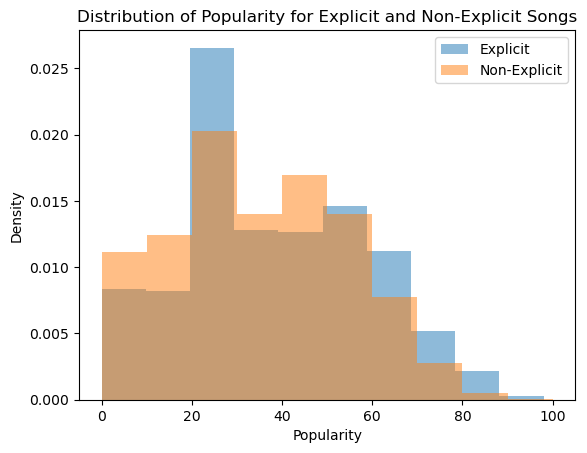

In [20]:
# Select data for explicit and non-explicit songs
explicit_data = data[data['explicit']]['popularity']
non_explicit_data = data[~data['explicit']]['popularity']

#Printing the sample means to see if they are the same or not
print(f'Sample mean of the popularity of the explicit data: {explicit_data.mean()}')
print(f'Sample mean of the popularity of the non-explicit data:{non_explicit_data.mean()}\n')

#Printing the sample sizes to see if they are the same or not
print(f'Sample size of the popularity of the explicit data: {explicit_data.shape[0]}')
print(f'Sample size of the popularity of the non-explicit data:{non_explicit_data.shape[0]}\n')

#Printing the variances to see if they are the same or not
print(f'Variance of the popularity of the explicit data: {explicit_data.var()}')
print(f'Variance of the popularity of the non-explicit data: {non_explicit_data.var()}\n')


# Perform Mann-Whitney U test
statistic, p_value = mannwhitneyu(explicit_data, non_explicit_data)

# Print the p-value
print(f"Mann-Whitney U test p-value: {p_value}")

# Determine significance
alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis. There is a significant difference in popularity.")
else:
    print("Fail to reject the null hypothesis. There is no significant difference in popularity.")

    
# Plot histograms overlayed
plt.hist(explicit_data, alpha=0.5, label='Explicit', density=True)
plt.hist(non_explicit_data, alpha=0.5, label='Non-Explicit', density=True)
plt.xlabel('Popularity')
plt.ylabel('Density')
plt.legend()
plt.title('Distribution of Popularity for Explicit and Non-Explicit Songs')
plt.show()

Response to Question 3: For this question, I performed a Mann Whitney U test to investigate whether explicitly rated songs more popular than songs that are not explicit, because the distributions are not normal, as seen in the Histograms that overlayed on top of each other, above, therefore a t-test could not be performed because it assumes the distributions are normal. Additionally, the variances were not the same and nor were the sample sizes and thus neither a t-test nor a Welch's t-test could be performed. Using the Mann Whitney U test, a p-value of practically 0 (6.095345411719456e-21) was produced, and because it was less than alpha, 0.05, I rejected the null hypothesis, with the null hypothesis being that there is no statistically significant difference between the popularity of explicit songs and non-explicit songs, and therefore I concluded that there is a significant difference in popularity. In English, this means that explicit songs are more popular than non-explicit songs and there is a statistically significant difference in the two groups of songs: songs that are non-explicit and the songs that are explicit, that is unlikely due to chance.


# Question 4: Are songs in major key more popular than songs in minor key? 

Sample mean of the popularity of major key songs: 34.61602690040804
Sample mean of the popularity of minor key songs: 35.203375

Sample size of the popularity of major key songs: 26468
Sample size of the popularity of minor key songs: 16000

Variance of the popularity of major key songs: 381.516782460773
Variance of the popularity of minor key songs: 407.40247626414845

Mann-Whitney U test p-value: 0.9924090471044591
Fail to reject the null hypothesis. There is no significant difference in popularity.


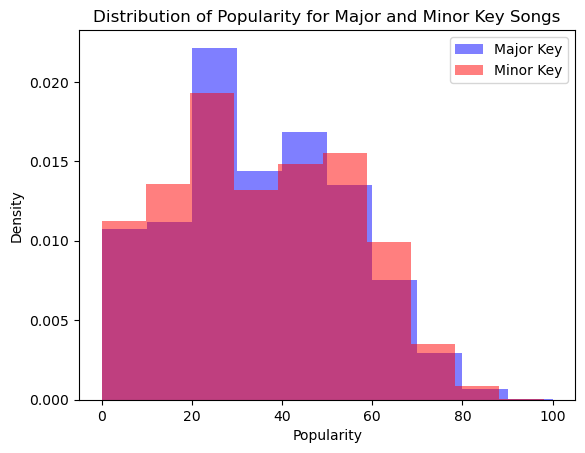

In [21]:
# Assuming 'popularity' and 'mode' are columns in your DataFrame
popularity_and_mode = data[['popularity', 'mode']]

# Function for NaN removal on a specific subset of columns, a.k.a mode and popularity
def nanRemover(subset):
    return subset[~np.isnan(subset).any(axis=1)]

# NaN removal for the mode and popularity columns
popularity_and_mode = nanRemover(popularity_and_mode)

# Select data for major and minor key songs
major_key_data = popularity_and_mode[popularity_and_mode['mode'] == 1]['popularity']  # A major
minor_key_data = popularity_and_mode[popularity_and_mode['mode'] == 0]['popularity']

#Printing the sample means to see if they are the same or not
print(f'Sample mean of the popularity of major key songs: {major_key_data.mean()}')
print(f'Sample mean of the popularity of minor key songs: {minor_key_data.mean()}\n')

#Printing the sample sizes to see if they are the same or not
print(f'Sample size of the popularity of major key songs: {major_key_data.shape[0]}')
print(f'Sample size of the popularity of minor key songs: {minor_key_data.shape[0]}\n')

#Printing the variances to see if they are the same or not
print(f'Variance of the popularity of major key songs: {major_key_data.var()}')
print(f'Variance of the popularity of minor key songs: {minor_key_data.var()}\n')

# Perform Mann-Whitney U test
statistic, p_value = mannwhitneyu(major_key_data, minor_key_data, alternative='greater')

# Print the p-value
print(f"Mann-Whitney U test p-value: {p_value}")

# Determine significance
alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis. There is a significant difference in popularity.")
else:
    print("Fail to reject the null hypothesis. There is no significant difference in popularity.")

# Plot histograms overlayed
plt.hist(major_key_data, alpha=0.5, label='Major Key', density=True, color='blue')
plt.hist(minor_key_data, alpha=0.5, label='Minor Key', density=True, color='red')
plt.xlabel('Popularity')
plt.ylabel('Density')
plt.legend()
plt.title('Distribution of Popularity for Major and Minor Key Songs')
plt.show()


Response to Question 4: For this question, I performed a Mann Whitney U test to investigate whether songs in major key more popular than songs in minor key, because the distributions are not normal, as seen in the histograms that overlayed on top of each other, above, therefore a t-test could not be performed because it assumes the distributions are normal. Additionally, the variances were not the same and nor were the sample sizes and thus neither a t-test nor a Welch's t-test could be performed. Using the Mann Whitney U test, a p-value of practically 1 (0.9924090471044591) was produced, and because it was more than alpha, 0.05, I failed to reject the null hypothesis, with the null hypothesis being that there is no statistically significant difference between the popularity of songs in major key and songs in minor key, and therefore I concluded that there is no significant difference in popularity. In English, this means that songs in major key are neither more nor less popular than songs in minor key and therefore the differences that exist between those two groups of songs is highly likely due to chance.

# Question 5: Energy is believed to largely reflect the “loudness” of a song. Can you substantiate (or refute) that this is the case?

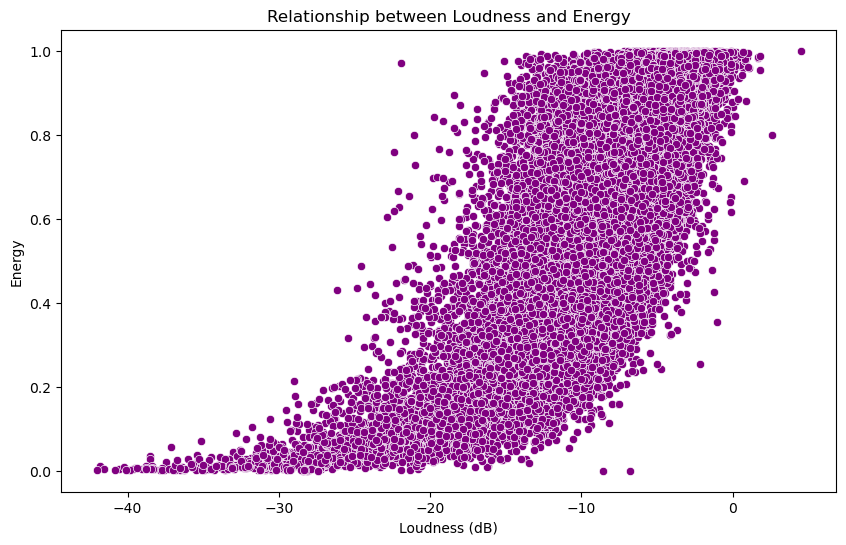

Spearman's Correlation Coefficient: 0.7390
Pearson's Correlation Coefficient: 0.7746


In [22]:
loudness_and_energy = ['loudness', 'energy']

# Create a subset with the song features for this question
loudness_and_energy = data[loudness_and_energy]

# Function for NaN removal on a specific subset of columns, a.k.a loudness and energy
def nanRemover(subset):
    return subset[~np.isnan(subset).any(axis=1)]

# NaN removal for the loudness and energy columns
loudness_and_energy = nanRemover(loudness_and_energy)

# Create a DataFrame with standardized values
loudness_and_energy_df = pd.DataFrame(loudness_and_energy, columns=['loudness', 'energy'])

# Plot the scatterplot with standardized variables
plt.figure(figsize=(10, 6))
sns.scatterplot(x='loudness', y='energy', data=loudness_and_energy_df, color='purple')
plt.title('Relationship between Loudness and Energy')
plt.xlabel('Loudness (dB)')
plt.ylabel('Energy')
plt.show()

# Spearman's correlation coefficient (used when data is not normally distributed and ordinal or ranked data, used to evaluate monotonic relationships)
spearman_corr, _ = stats.spearmanr(loudness_and_energy_df['loudness'], loudness_and_energy_df['energy'])
print(f"Spearman's Correlation Coefficient: {spearman_corr:.4f}")

#Spearman's correlation coefficient is more robust to outliers than is Pearson's correlation coefficient.

# Pearson's correlation coefficient (used when data is normally distributed and to assess linear relationships)
pearson_corr, _ = stats.pearsonr(loudness_and_energy_df['loudness'], loudness_and_energy_df['energy'])
print(f"Pearson's Correlation Coefficient: {pearson_corr:.4f}")


Response to Question 5: Based on the Pearson's correlation coefficient being 0.7746 and Spearman's correlation coefficient being 0.7390, it can be stated there is a relatively strong positive correlation between the energy and the loudness of a song, since 0.77 is closer to 1 than 0, meaning there is a relatively a storng correlation since the closer the corelation coeeficent value is to 1 or -1 the stronger the correlation there is between the two variables, and since 0.7746 is positive, it is a positive correlation. This does support the idea or claim that the energy of a song does largely reflects the loudness of a song, meaning the "louder" a song is, the higher the energy of the song, and respectively, the "less loud" the song is, the lower the energy of the song.

# Question 6: Which of the 10 song features in question 1 predicts popularity best? How good is this model?

Feature: duration
Correlation to popularity: -0.1019
Mean Absolute Error (MAE): 0.85
RMSE: 1.0029
R-squared: 0.0101

Feature: danceability
Correlation to popularity: 0.0683
Mean Absolute Error (MAE): 0.85
RMSE: 1.0058
R-squared: 0.0045

Feature: energy
Correlation to popularity: -0.0936
Mean Absolute Error (MAE): 0.84
RMSE: 1.0037
R-squared: 0.0086

Feature: loudness
Correlation to popularity: 0.0696
Mean Absolute Error (MAE): 0.85
RMSE: 1.0057
R-squared: 0.0047

Feature: speechiness
Correlation to popularity: -0.0804
Mean Absolute Error (MAE): 0.84
RMSE: 1.0048
R-squared: 0.0064

Feature: acousticness
Correlation to popularity: 0.0458
Mean Absolute Error (MAE): 0.85
RMSE: 1.0071
R-squared: 0.0019

Feature: instrumentalness
Correlation to popularity: -0.2115
Mean Absolute Error (MAE): 0.82
RMSE: 0.9853
R-squared: 0.0446

Feature: liveness
Correlation to popularity: -0.0666
Mean Absolute Error (MAE): 0.85
RMSE: 1.0059
R-squared: 0.0042

Feature: valence
Correlation to popularity: 0.0068

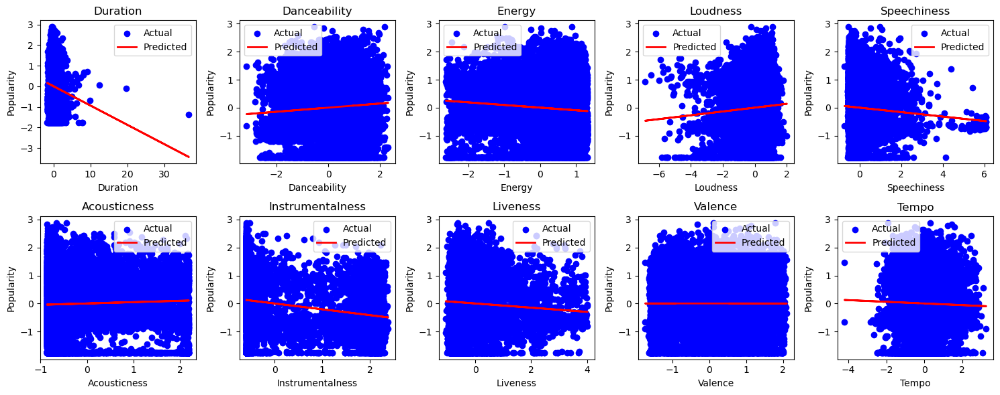

In [23]:
features = ['popularity', 'duration', 'danceability', 'energy', 'loudness', 'speechiness',
            'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo']

# Create a subset with the 10 song features
ten_plus_pop_features = data[features]

# Function for NaN removal on a specific subset of columns
def nanRemover(subset):
    return subset[~np.isnan(subset).any(axis=1)]

# NaN removal for the subset of features
subset_features_cleaned = nanRemover(ten_plus_pop_features)

# Set up a 2x5 grid for subplots
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(15, 6))

# Flatten the 2D array of axes to simplify indexing
axes = axes.flatten()

# Standardize the variables
scaler = StandardScaler()
ten_plus_pop_features_standardized = scaler.fit_transform(subset_features_cleaned)

# Create a DataFrame with standardized values
ten_plus_pop_features_standardized_df = pd.DataFrame(ten_plus_pop_features_standardized, columns=features)

for i, feature in enumerate(features[1:], 0):  # Exclude 'popularity' from the loop

    # Prepare data
    X = ten_plus_pop_features_standardized_df[[feature]]
    y = ten_plus_pop_features_standardized_df['popularity']

    # Reshape X for compatibility with train_test_split and cross_val_score
    X = X.values.reshape(-1, 1)

    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=16284294)

    # Initialize and fit the linear regression model
    model = LinearRegression()
    model.fit(X_train, y_train)

    # Make predictions on the test set
    y_pred = model.predict(X_test)

    # Evaluate the model
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    # Calculate the correlation coefficient
    correlation = np.corrcoef(X_test.flatten(), y_test)[0, 1]
    # Perform cross-validation
    cv_scores = cross_val_score(model, X, y, cv=5, scoring='neg_mean_squared_error')
    
    # Plot the linear regression line
    axes[i].scatter(X_test, y_test, color='blue', label='Actual')
    axes[i].plot(X_test, y_pred, color='red', linewidth=2, label='Predicted')
    axes[i].set_title(feature.title())
    axes[i].set_xlabel(feature.title())
    axes[i].set_ylabel('Popularity')
    axes[i].legend()
    
    # Output results
    print(f"Feature: {feature}")
    print(f"Correlation to popularity: {correlation:.4f}")
    print(f'Mean Absolute Error (MAE): {mae:.2f}')
    print(f"RMSE: {rmse:.4f}")
    print(f"R-squared: {r2:.4f}\n")

plt.tight_layout()
plt.show()

Response to Question 6: Based on the first image below the Question #6, which shows the correlation between each feature respectively and popularity. We can see the strongest correlation between one of the features listed and popularity out of all the features, is instrumentalness with a correlation coefficient of -0.2115, R^2 value of 0.0466, and RMSE value of 0.9853. Now, looking especially at instrumentalness, we can also see based on the linear regression models for each of the features and popularity, which is the second image, that none of them are very good models to predict popularity, and that makes sense because a song’s popularity is not affected by only 1 characteristic or feature of a song, since music is complex and music’s popularity is not just affected on how “danceable” it may be, there are many aspects that also affect a song's popularity that are outside of just a song’s characteristics. Thus, the linear models perform poorly in predicting a song’s popularity.  Ultimately, a song’s instrumentalness value is not a good predictor of a song’s popularity.

# Question 7: Building a model that uses *all* of the song features in question 1, how well can you predict popularity? How much (if at all) is this model improved compared to the model in question 6). How do you account for this?

Multiple Linear Regression:
RMSE: 18.991331268994223
R-squared: 0.09298249259621072
MAE using All Features: 15.407043367297948


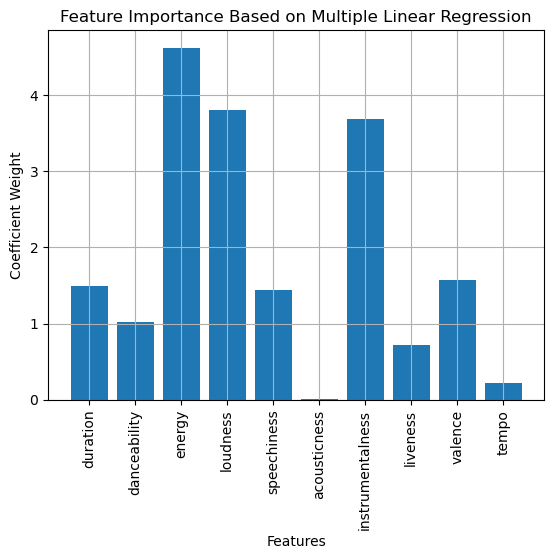

In [24]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, LassoCV
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler

# Features
features = ['duration', 'danceability', 'energy', 'loudness', 'speechiness',
            'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo']

# Create a subset with the 10 song features and 'popularity'
subset_features = data[features + ['popularity']]

# Function for NaN removal
def nanRemover(subset):
    return subset.dropna()

# NaN removal
subset_features_cleaned = nanRemover(subset_features)

# Standardize the variables
scaler = StandardScaler()
subset_features_standardized = scaler.fit_transform(subset_features_cleaned.iloc[:, :-1])

# Create a DataFrame with standardized values
subset_features_standardized_df = pd.DataFrame(subset_features_standardized, columns=features)

# Split the data into predictors (X) and target (y)
X = subset_features_standardized_df[features]
y = subset_features_cleaned['popularity']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=16284294)

# Multiple Linear Regression
linear_model = LinearRegression()
linear_model.fit(X_train, y_train)

# Predictions
y_pred_linear = linear_model.predict(X_test)

# Evaluate the model
rmse_linear = np.sqrt(mean_squared_error(y_test, y_pred_linear))
r2_linear = r2_score(y_test, y_pred_linear)
mae_linear = mean_absolute_error(y_test, y_pred_linear)

# Print the results
print("Multiple Linear Regression:")
print("RMSE:", rmse_linear)
print("R-squared:", r2_linear)
print("MAE using All Features:", mae_linear)

# Plotting the Column Names and Importance of Columns for Linear Regression
plt.bar(X.columns, np.abs(linear_model.coef_))
plt.xticks(rotation=90)
plt.grid()
plt.title("Feature Importance Based on Multiple Linear Regression")
plt.xlabel("Features")
plt.ylabel("Coefficient Weight")
plt.show()


Response to Question 7: In the code, I built a multiple linear regression model to make this model use all the song features from question 1 to see how well I can predict popularity. Comparing the performance of the model in question 6, which was a linear regression model for each of the features individually, specifically looking at the instrumentalness feature, and the multiple linear regression model for this question, I noticed the Multiple Linear Regression model with all features shows a relatively low R-squared value (0.09298), and the R-squared for the "instrumentalness" feature alone is also relatively low (0.0446), indicating that neither model explains a large portion of the variance in popularity. Although, even though the multiple linear regression model only explains 9% of the variation in popularity, it is still more than the variance explained by the model in Question 6, the linear regression model of the “instrumentalness” feature, which is 4%.  The RMSE values for both models suggest that the model using all features has a larger prediction error (RMSE of 18.99) compared to the model in question 6, (which has an RMSE of 0.9853), which makes sense because none of the features really do well in predicting popularity so having a model with all the features would create a larger error in prediction than a model that uses only 1 feature. This same explanation and reasoning applies to why the MAE for the multiple linear regression model using all features is considerably higher (15.4070) compared to the model in question 6 (0.82).  Ultimately, the low R-squared values for both models suggest that neither “single” linear nor multiple linear regression models are effective in capturing the complexity of factors influencing song popularity. As mentioned in Question 6’s response, a song's popularity is likely influenced by multiple complex factors beyond individual characteristics. Therefore, the multiple linear regression model in question 7 is only ever so slightly better than the model in question 6 just by the R-squared value, but not enough so to say that the model somehow improved a reasonable or considerable amount, which is realistic because a song’s popularity is influenced by not just song’ characteristics but also by people’s personal experiences, emotions, and many more outside factors that exist beyond this data.

# Question 8: When considering the 10 song features above, how many meaningful principal components can you extract? What proportion of the variance do these principal components account for? Using the principal components, how many clusters can you identify?

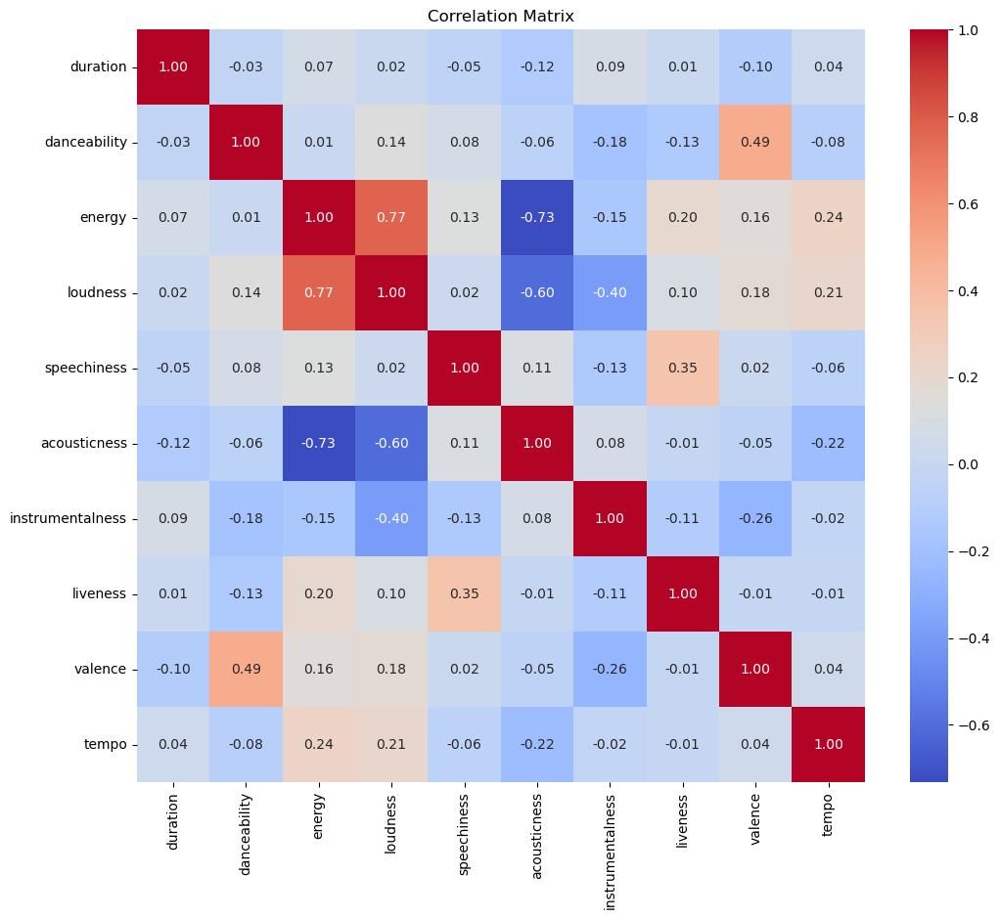

In [25]:
# Visualize the correlation matrix
plt.figure(figsize=(12, 10))
sns.heatmap(ten_features_standardized_df.corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix')
plt.show()

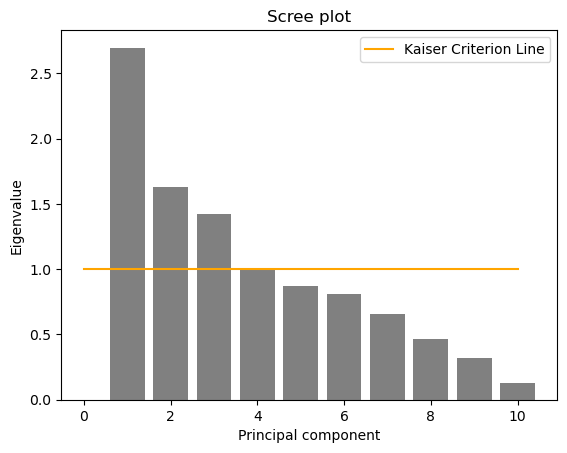

Number of factors selected by Kaiser criterion: 3
Number of factors selected by elbow criterion: 1
Number of factors to account for at least 90% variance: 7


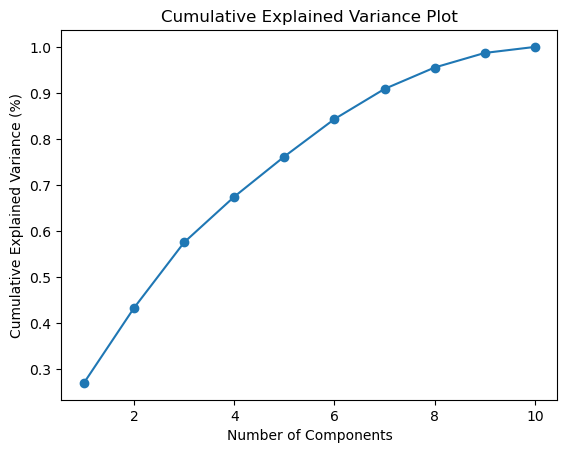

In [26]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from scipy import stats

# Define the 10 song features
features = ['duration', 'danceability', 'energy', 'loudness', 'speechiness',
            'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo']

# Create a subset with the 10 song features
ten_features = data[features]

# Function for NaN removal on a specific subset of columns
def nanRemover(subset):
    return subset[~np.isnan(subset).any(axis=1)]

# NaN removal for the subset of features
ten_features = nanRemover(ten_features)

# Standardize the variables
scaler = StandardScaler()
ten_features_standardized = scaler.fit_transform(ten_features)

# Create a DataFrame with standardized values
ten_features_standardized_df = pd.DataFrame(ten_features_standardized, columns=['duration', 'danceability', 'energy', 'loudness', 'speechiness',
            'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo'])


X = ten_features_standardized_df[['duration', 'danceability', 'energy', 'loudness', 'speechiness',
            'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo']]
y = ten_plus_pop_features_standardized_df['popularity']

# # Actual PCA (Principal Componenet Analysis)
# Step 1: NOTE we would normally have to zscore or standardize but we already did this earlier in the ten_fetures_standardized
# 2. Initialize PCA object and fit to our data:
pca = PCA().fit(X)


# 3a. Eigenvalues: Single vector of eigenvalues in decreasing order of magnitude | The sum of all eigenvalues will be 10 here
eigVals = pca.explained_variance_

#This is just to check that sum is 10
eigsum = 0
for val in eigVals:
    eigsum += val
#print(eigsum)
#eigen sum is in fact 10

# 3b. "Loadings" (eigenvectors): Weights per factor in terms of the original data. 
# In which directions do the eigenvectors point
# Rows are eigenvecotrs
# Columns are song features
loadings = pca.components_
#print(loadings.shape)
#10 components

# 3c. FInal version of PCA (aka rotatedDATA) so we make PCA dataframa: 
rotatedData = pca.fit_transform(X)
#print(rotatedData.shape)
#(X, Y) X is the number of songs, and Y is 10 components
pca_df = pd.DataFrame(rotatedData)
princip_compon = rotatedData

# 4. variance explained: 
varExplained = eigVals/sum(eigVals)*100

# 5. Making a scree plot:
num_statements = len(eigVals)
num_statements = 10
x = np.linspace(1,num_statements,num_statements)
plt.bar(x, eigVals, color='gray')
plt.plot([0,num_statements],[1,1],color='orange', label = "Kaiser Criterion Line") # Orange Kaiser criterion line
plt.title('Scree plot')
plt.xlabel('Principal component')
plt.ylabel('Eigenvalue')
plt.legend()
plt.show()



kaiserThreshold = 1
print('Number of factors selected by Kaiser criterion:', np.count_nonzero(eigVals > kaiserThreshold))

# 2) The "elbow" criterion: Pick only factors left of the bend. 
# Here, this would yield 1 factor.
print('Number of factors selected by elbow criterion: 1') #Due to visual inspection by primate
# Visual inspection is not great - next week, we will learn a better way to do that for clusters

# 3) Number of factors that account for 90% of the variance (Eigenvalues that 
# add up to 90% of the Eigensum. To account for at least 90% of the variability 
# in this data, we need 3 factors.
threshold = 90 #90% is a commonly used threshold
eigSum = np.cumsum(varExplained) #Cumulative sum of the explained variance 
print('Number of factors to account for at least 90% variance:', np.count_nonzero(eigSum < threshold) + 1)

# Plot to determine the number of components
plt.plot(np.arange(1, len(pca.explained_variance_ratio_) + 1), np.cumsum(pca.explained_variance_ratio_), marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance (%)')
plt.title('Cumulative Explained Variance Plot')
plt.show()

In [27]:
#This code is just to show much of the variance of the data is explained or accounte for by our 3 components 
pca_var_explained = 0

for var in varExplained[0: (np.count_nonzero(eigVals > kaiserThreshold))]:
    pca_var_explained = pca_var_explained + var
print(f"The variance of the data that's explained by our {(np.count_nonzero(eigVals > kaiserThreshold))} PCs that we chose based on the Kaiser criterion, is {pca_var_explained.round(2)}%.")

The variance of the data that's explained by our 3 PCs that we chose based on the Kaiser criterion, is 57.52%.


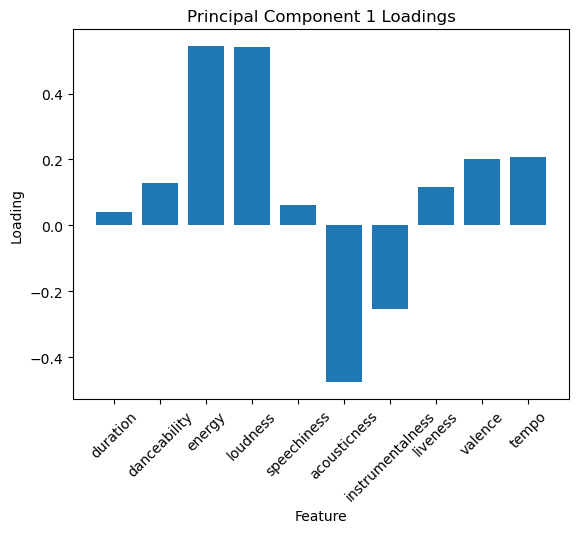

In [28]:
#Interpreting the factors - this is perhaps the step that requires the most "finesse"
whichPrincipalComponent = 0  # Select and look at one factor at a time, in Python indexing

# Select the specific principal component loadings
component_loadings = loadings[whichPrincipalComponent, :]*-1

# Create an array of indices for the features
feature_indices = np.arange(len(features))

# Plot the loadings
plt.bar(feature_indices, component_loadings)
plt.xlabel('Feature')
plt.ylabel('Loading')
plt.title(f'Principal Component {whichPrincipalComponent + 1} Loadings')
plt.xticks(feature_indices, features, rotation=45)
plt.show()


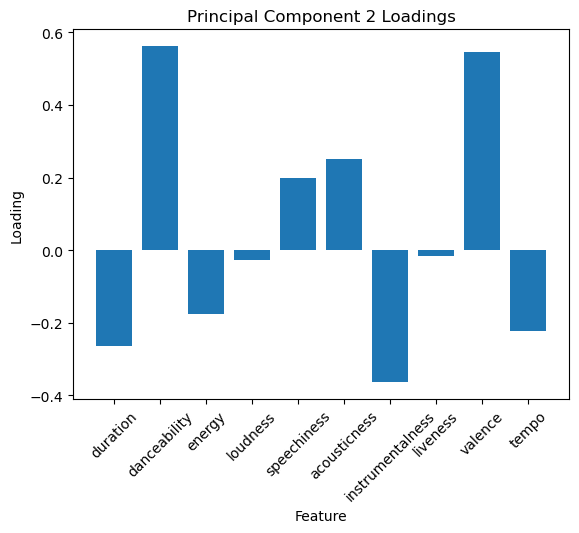

In [29]:
whichPrincipalComponent = 1  # Select and look at one factor at a time, in Python indexing

# Select the specific principal component loadings
component_loadings = loadings[whichPrincipalComponent, :]*-1 

# Create an array of indices for the features
feature_indices = np.arange(len(features))

# Plot the loadings
plt.bar(feature_indices, component_loadings)
plt.xlabel('Feature')
plt.ylabel('Loading')
plt.title(f'Principal Component {whichPrincipalComponent + 1} Loadings')
plt.xticks(feature_indices, features, rotation=45)
plt.show()


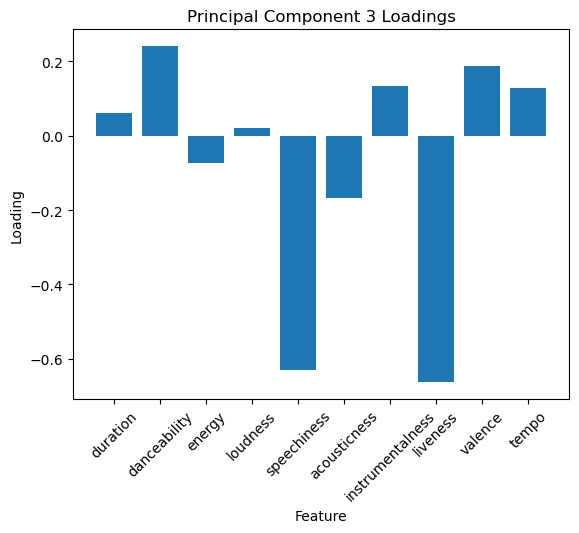

In [30]:
whichPrincipalComponent = 2  # Select and look at one factor at a time, in Python indexing

# Select the specific principal component loadings
component_loadings = loadings[whichPrincipalComponent, :]*-1 #basically how components_ is is it is (components, features)
# therefore each row is the weight of each feature in a new component

# Create an array of indices for the features
feature_indices = np.arange(len(features))

# Plot the loadings
plt.bar(feature_indices, component_loadings)
plt.xlabel('Feature')
plt.ylabel('Loading')
plt.title(f'Principal Component {whichPrincipalComponent + 1} Loadings')
plt.xticks(feature_indices, features, rotation=45)
plt.show()


/Users/alexandraprzysucha/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/alexandraprzysucha/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/alexandraprzysucha/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/alexandraprzysucha/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarni

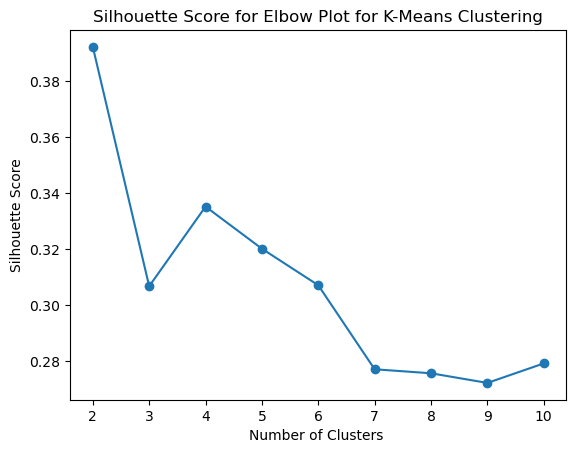

In [31]:
from sklearn.metrics import silhouette_score

# List to store silhouette scores
silhouette_scores = []
possible_k_values = range(2, 11)  # Start from 2 clusters, as silhouette score requires at least two clusters

# Try different numbers of clusters
for n_clusters in possible_k_values:
    kmeans = KMeans(n_clusters=n_clusters, random_state=16284294)
    cluster_labels = kmeans.fit_predict(princip_compon[:, :3])
    silhouette_avg = silhouette_score(princip_compon[:, :3], cluster_labels)
    silhouette_scores.append(silhouette_avg)

# Plotting the silhouette scores
plt.plot(possible_k_values, silhouette_scores, marker='o')
plt.title('Silhouette Score for Elbow Plot for K-Means Clustering')
plt.xlabel('Number of Clusters ')
plt.ylabel('Silhouette Score')
plt.show()

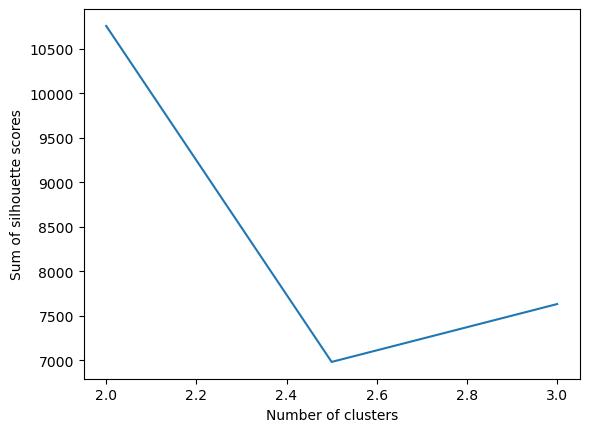

From the graph of number of clusters and sum of silhouette scores, we can observe that the highest sum of silhouette score corresponds to 2 clusters.


In [32]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples
import numpy as np
import matplotlib.pyplot as plt

# Combine features into a single array
predictors = ten_features_standardized_df.to_numpy()

num_clusters = 3  # how many clusters are we looping over? (from 2 to 10)
silhouette_sums = np.empty([num_clusters, 1]) * np.NaN  # init container to store sums

# Compute kMeans for each k:
for k in range(2, num_clusters + 2):  # Loop through each cluster (from 2 to 10)
    kmeans = KMeans(n_clusters=k, n_init=10).fit(predictors)  # Compute kmeans using scikit
    cluster_ids = kmeans.labels_  # Vector of cluster IDs that the row belongs to
    s = silhouette_samples(predictors, cluster_ids)  # Compute the mean silhouette coefficient of all samples
    silhouette_sums[k - 2] = sum(s)  # Take the sum ==> Highest sum = best clustering

# Plot the sum of the silhouette scores as a function of the number of clusters
plt.plot(np.linspace(2, num_clusters, num_clusters), silhouette_sums)
plt.xlabel('Number of clusters')
plt.ylabel('Sum of silhouette scores')
plt.show()

# Choose the number of clusters with the highest silhouette score
optimal_num_clusters = np.argmax(silhouette_sums) + 2  # Add 2 because the loop starts from 2
print(f"From the graph of number of clusters and sum of silhouette scores, we can observe that the highest sum of silhouette score corresponds to {optimal_num_clusters} clusters.")



/Users/alexandraprzysucha/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


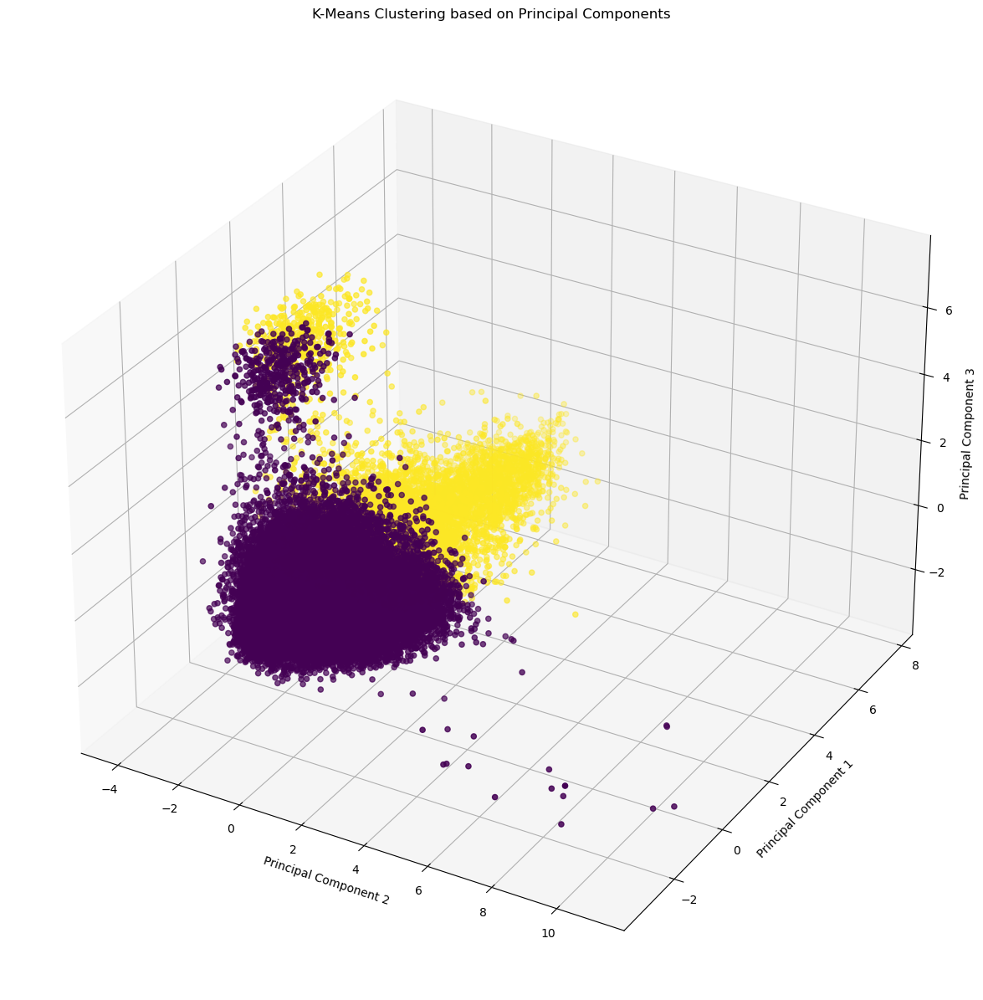

In [82]:
from mpl_toolkits.mplot3d import Axes3D

# Use the identified number of principal components for clustering with KMeans
kmeans = KMeans(n_clusters=2, random_state=16284294)  # the number of clusters based on my analysis is 2
cluster_labels = kmeans.fit_predict(princip_compon[:, :3])

# 3D Scatter plot of the first three principal components with cluster labels
fig = plt.figure(figsize=(15, 15))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(princip_compon[:, 1], princip_compon[:, 0], princip_compon[:, 2], c=cluster_labels, cmap='viridis')

# Set axes label
ax.set_title('K-Means Clustering based on Principal Components')
ax.set_xlabel('Principal Component 2')
ax.set_ylabel('Principal Component 1')
ax.set_zlabel('Principal Component 3')
plt.show()


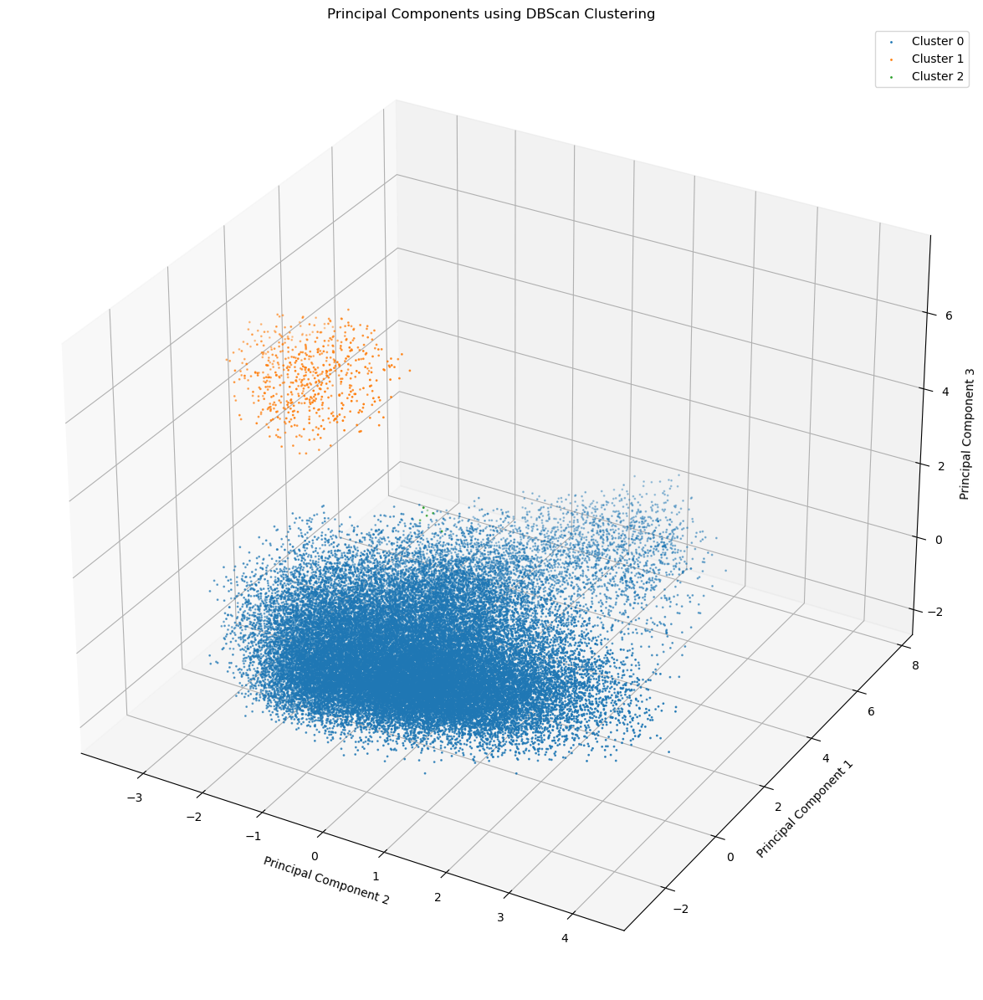

In [81]:
from sklearn.cluster import DBSCAN
from mpl_toolkits.mplot3d import Axes3D

# Assuming you have 'princip_compon' defined
y = np.column_stack((princip_compon[:, 1], princip_compon[:, 0], princip_compon[:, 2]))
# Fit model to our data using DBSCAN
dbscanModel = DBSCAN(eps = 0.4, min_samples = 10).fit(y)

# Get our labels for each data point
labels = dbscanModel.labels_

# Visualization
fig = plt.figure(figsize=(15, 15))
ax = fig.add_subplot(111, projection='3d')

numClusters = len(set(labels)) - (1 if -1 in labels else 0)  # Calculate the number of clusters

# Scatter plot for each cluster
for ii in range(numClusters):
    labelIndex = np.argwhere(labels == ii)
    ax.scatter(
        princip_compon[labelIndex, 1],
        princip_compon[labelIndex, 0],
        princip_compon[labelIndex, 2],
        s=1,
        marker='o',
        label=f'Cluster {ii}'
    )

ax.set_xlabel('Principal Component 2')
ax.set_ylabel('Principal Component 1')
ax.set_zlabel('Principal Component 3')
ax.set_title('Principal Components using DBScan Clustering')
ax.legend()
plt.show()


In [80]:
from sklearn.metrics import silhouette_samples
from sklearn.cluster import DBSCAN
from mpl_toolkits.mplot3d import Axes3D  # Import Axes3D for 3D plotting

# Rotated Data - simply the transformed data:
origDataNewCoordinates = pca.fit_transform(X)*-1

# Format data:
x = np.column_stack((origDataNewCoordinates[:,0], origDataNewCoordinates[:,1], origDataNewCoordinates[:,2]))



# Question 9: Can you predict whether a song is in major or minor key from valence? If so, how good is this prediction? If not, is there a better predictor? [Suggestion: It might be nice to show the logistic regression once you are done building the model]

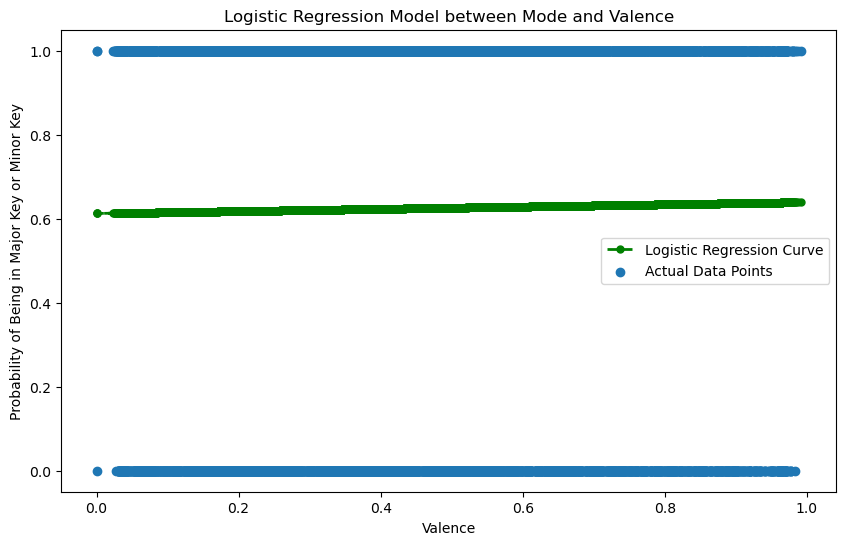

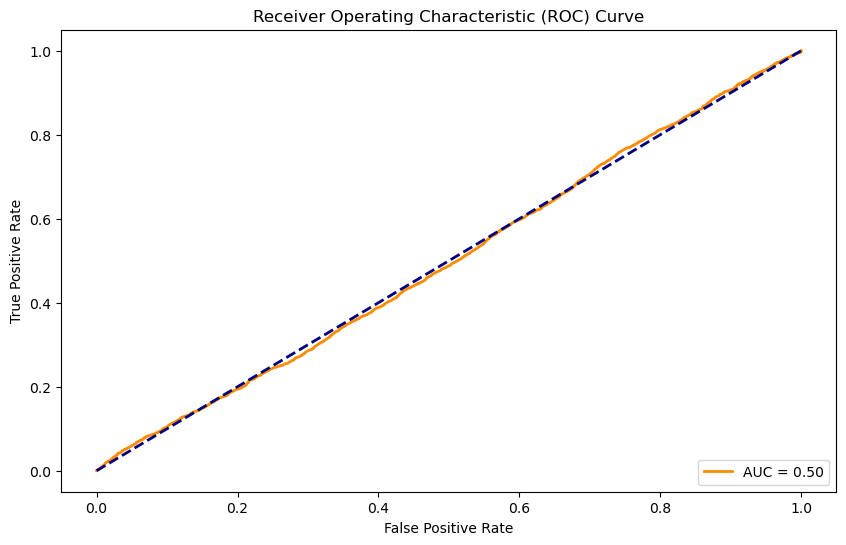

AUC Score: 0.50


In [36]:
from sklearn.metrics import roc_curve, roc_auc_score, auc
# Prepare valence and mode for logistic regression
X_logistic = data[['valence']]
y_logistic = data['mode']  # Major: 1, Minor: 0

# Split the data into training and testing sets
X_train_log, X_test_log, y_train_log, y_test_log = train_test_split(X_logistic, y_logistic, test_size=0.2, random_state=16284294)

# Fit logistic regression model
logistic_model = LogisticRegression()
logistic_model.fit(X_train_log, y_train_log)

# Predict probabilities on the test set
y_pred_log_prob = logistic_model.predict_proba(X_test_log)[:, 1]

# Plotting the logistic regression curve
plt.figure(figsize=(10, 6))
plt.plot(X_test_log, y_pred_log_prob, 'go--', linewidth=2, markersize=5, label='Logistic Regression Curve')

# Scatter plot for the data points
plt.scatter(X_test_log, y_test_log, label='Actual Data Points')

plt.title('Logistic Regression Model between Mode and Valence')
plt.xlabel('Valence')
plt.ylabel('Probability of Being in Major Key or Minor Key')
plt.legend()
plt.show()

 #logistic regression go thoguh all key vs all variables for logistic and see if any do better than valence vs (mode) key 
#AUC AND ROC CURVes

# Calculate the ROC curve
fpr, tpr, thresholds = roc_curve(y_test_log, y_pred_log_prob)

# Calculate the AUC score
roc_auc = auc(fpr, tpr)

# Plot the ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'AUC = {roc_auc:.2f}')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Print the AUC score
print(f'AUC Score: {roc_auc:.2f}')



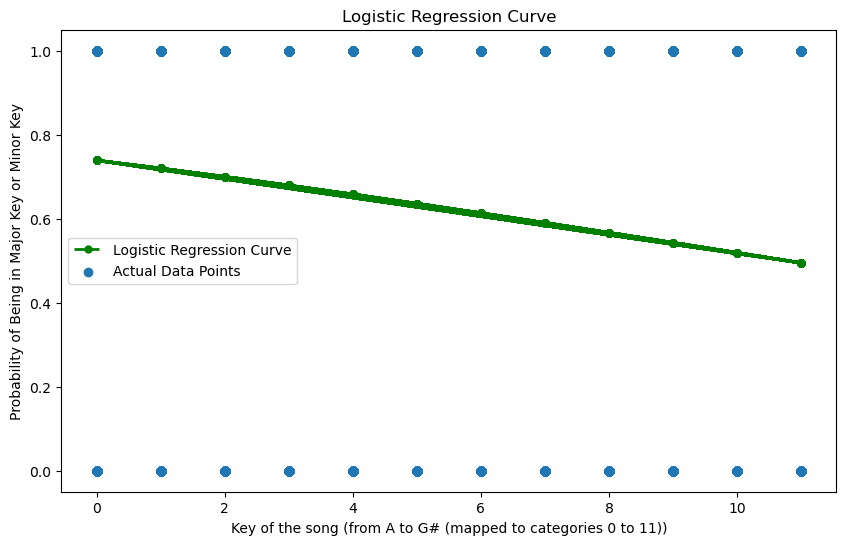

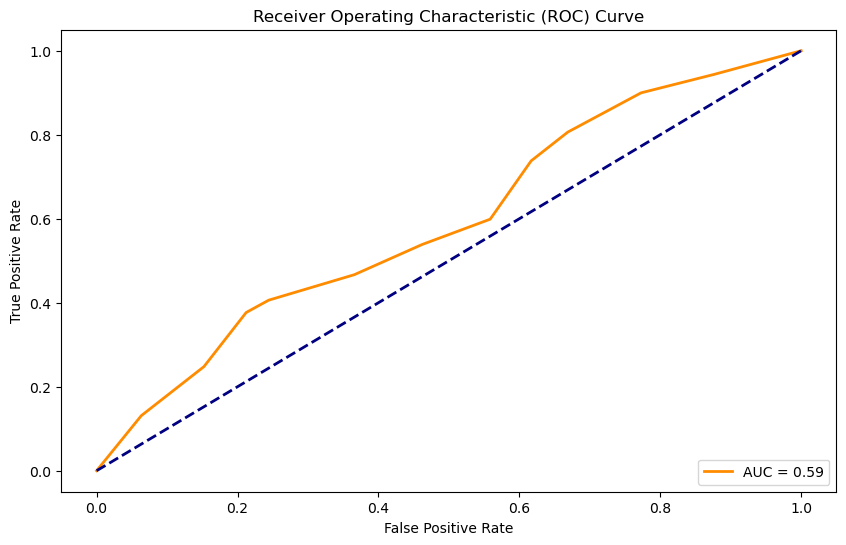

AUC Score: 0.59


In [37]:
from sklearn.metrics import roc_curve, roc_auc_score, auc

# Prepare key and mode for logistic regression
X_logistic = data[['key']]
y_logistic = data['mode']  # Major: 1, Minor: 0

# Split the data into training and testing sets
X_train_log, X_test_log, y_train_log, y_test_log = train_test_split(X_logistic, y_logistic, test_size=0.2, random_state=16284294)

# Fit logistic regression model
logistic_model = LogisticRegression()
logistic_model.fit(X_train_log, y_train_log)

# Predict probabilities on the test set
y_pred_log_prob = logistic_model.predict_proba(X_test_log)[:, 1]

# Plotting the logistic regression curve
plt.figure(figsize=(10, 6))
plt.plot(X_test_log, y_pred_log_prob, 'go--', linewidth=2, markersize=5, label='Logistic Regression Curve')

# Scatter plot for the data points
plt.scatter(X_test_log, y_test_log, label='Actual Data Points')

plt.title('Logistic Regression Curve')
plt.xlabel('Key of the song (from A to G# (mapped to categories 0 to 11))')
plt.ylabel('Probability of Being in Major Key or Minor Key')
plt.legend()
plt.show()
 #logistic regression go thoguh all key vs all variables for logistic and see if any do better than valence vs (mode) key 

# Calculate the ROC curve
fpr, tpr, thresholds = roc_curve(y_test_log, y_pred_log_prob)

# Calculate the AUC score
roc_auc = auc(fpr, tpr)

# Plot the ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'AUC = {roc_auc:.2f}')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Print the AUC score
print(f'AUC Score: {roc_auc:.2f}')



Response to Question 9: I did a logistic regression model between valence and mode, where mode was a feature that was a binary categorical variable, where 1 represented the song being in major key, and 0 represented the song being in minor key. The model’s accuracy was shown through the AUC (area under the ROC curve) that is displayed on the graph above on the right, and it performed poorly with an AUC score of 0.50, which meant the model was practically random guessing from the valence of song whether the song was in major or in minor key. The best predictor of “mode”, or whether a song was in major or in minor key, was key, which makes logical sense because the key feature was representative of what key the song was from A to G# (mapped to categories 0 to 11). The model and ROC curve below of key predicting mode, shows an AUC score of 0.59, which is better than the logistic regression model of valence and mode, where valence was attempting to predict whether the song was in major or in minor key. Therefore, key is a better predictor than valence to predict whether the song is in major or in minor key.

# Question 10: Can you predict the genre, either from the 10 song features from question 1 directly or the principal components you extracted in question 8? [Suggestion: Use a classification tree, but you might have to map the qualitative genre labels to numerical labels first]

In [38]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# Assuming 'data' is your DataFrame
X_tree = data[['duration', 'danceability', 'energy', 'loudness', 'speechiness',
               'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo']]
y_tree = data['track_genre']

# Convert genre labels to numerical values
label_encoder = LabelEncoder()
y_tree_encoded = label_encoder.fit_transform(y_tree)

# Split the data into training and testing sets
X_train_tree, X_test_tree, y_train_tree, y_test_tree = train_test_split(X_tree, y_tree_encoded, test_size=0.2, random_state=16284294)

# Fit classification tree model with gini criterion
tree_model = DecisionTreeClassifier(criterion="gini")
tree_model.fit(X_train_tree, y_train_tree)

# Evaluate the model
y_pred_tree = tree_model.predict(X_test_tree)
accuracy_tree = accuracy_score(y_test_tree, y_pred_tree)

print(f'Using Original 10 Song Features:')
print(f'For Classification Tree (Genre Prediction):')
print(f'Accuracy: {accuracy_tree:.2f}')

print("Precision\n", precision_score(y_test_tree, y_pred_tree, average = 'macro'))
print("Recall\n", recall_score(y_test_tree, y_pred_tree, average = 'macro'))

# Print classification report (includes precision, recall, f1-score, and support)
class_report = classification_report(y_test_tree, y_pred_tree, target_names=label_encoder.classes_)
print("\nClassification Report:")
print(class_report)

Using Original 10 Song Features:
For Classification Tree (Genre Prediction):
Accuracy: 0.22
Precision
 0.20710141296293946
Recall
 0.20577058735135706

Classification Report:
                precision    recall  f1-score   support

      acoustic       0.14      0.16      0.15       184
      afrobeat       0.19      0.17      0.18       192
      alt-rock       0.08      0.08      0.08       176
   alternative       0.06      0.08      0.07        38
       ambient       0.35      0.39      0.37       198
         anime       0.12      0.13      0.13       189
   black-metal       0.35      0.40      0.38       193
     bluegrass       0.25      0.23      0.24       196
         blues       0.06      0.07      0.06       134
        brazil       0.08      0.09      0.09       166
     breakbeat       0.20      0.22      0.21       190
       british       0.09      0.08      0.08       194
      cantopop       0.24      0.21      0.22       204
 chicago-house       0.38      0.43     

In [39]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

#X is our feature matrix
X = data[['duration', 'danceability', 'energy', 'loudness', 'speechiness',
               'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo']]
y = data['track_genre']
# Step 1: Standardize the data
scaler = StandardScaler()
X_standardized = scaler.fit_transform(X)

# Step 2: Apply PCA
num_components = 3  # Choose the number of principal components, which we want 3
pca = PCA(n_components=num_components)
principal_components = pca.fit_transform(X_standardized)
#print(principal_components)
#print(principal_components.shape)
principal_components = pd.DataFrame(principal_components)
principal_components.head()
# principal_components now contains the transformed data with reduced dimensions

# we want to see the variance explained by each principal component, we do this:
explained_variance_ratio = pca.explained_variance_ratio_
print("Explained Variance Ratios:", explained_variance_ratio)

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report
from sklearn.preprocessing import LabelEncoder

# Encode genre labels
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(principal_components, y_encoded, test_size=0.2, random_state=16284294)

# Fit classification tree model
tree_model = DecisionTreeClassifier(criterion="gini")
tree_model.fit(X_train, y_train)

# Evaluate the model
y_pred_tree = tree_model.predict(X_test)
accuracy_tree = accuracy_score(y_test, y_pred_tree)
report = classification_report(y_test, y_pred_tree, target_names=label_encoder.classes_)

print(f'Using Principal Components:')
print(f'For Classification Tree (Genre Prediction):')
print(f'Accuracy: {accuracy_tree:.2f}')
print("Precision", precision_score(y_test_tree, y_pred_tree, average = 'macro'))
print("Recall:", recall_score(y_test_tree, y_pred_tree, average = 'macro'))
print('Classification Report:\n', report)

Explained Variance Ratios: [0.26970697 0.16310306 0.14242392]
Using Principal Components:
For Classification Tree (Genre Prediction):
Accuracy: 0.11
Precision 0.1018816520523324
Recall: 0.10077318427545465
Classification Report:
                 precision    recall  f1-score   support

      acoustic       0.11      0.12      0.11       184
      afrobeat       0.04      0.04      0.04       192
      alt-rock       0.08      0.07      0.08       176
   alternative       0.04      0.05      0.05        38
       ambient       0.27      0.25      0.26       198
         anime       0.03      0.03      0.03       189
   black-metal       0.24      0.25      0.25       193
     bluegrass       0.06      0.06      0.06       196
         blues       0.03      0.03      0.03       134
        brazil       0.05      0.07      0.06       166
     breakbeat       0.08      0.08      0.08       190
       british       0.08      0.07      0.07       194
      cantopop       0.11      0.11      

# Extra Credit

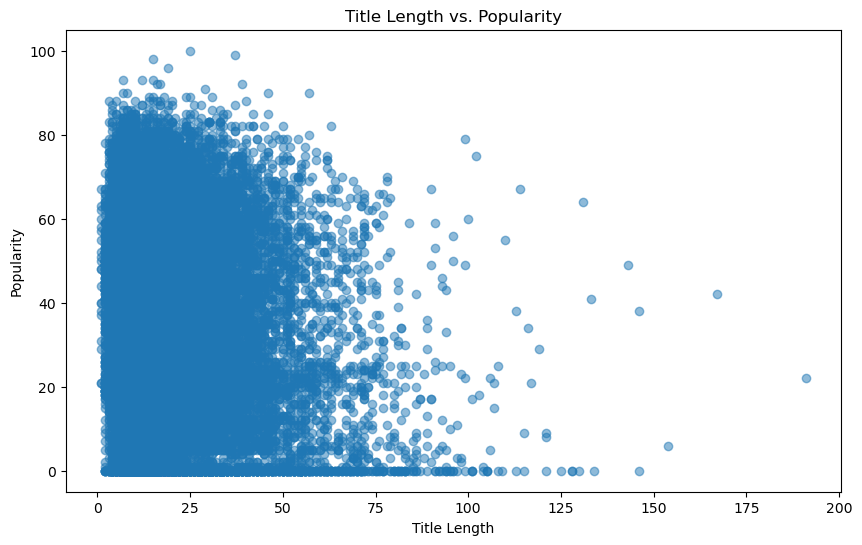

In [40]:
import pandas as pd
import matplotlib.pyplot as plt

# Create a new column for the length of song titles
data['title_length'] = data['track_name'].apply(lambda x: len(str(x)))

# Scatter plot to visualize the relationship between title length and popularity
plt.figure(figsize=(10, 6))
plt.scatter(data['title_length'], data['popularity'], alpha=0.5)
plt.title('Title Length vs. Popularity')
plt.xlabel('Title Length')
plt.ylabel('Popularity')
plt.show()

In [41]:
# Calculate correlation coefficients
correlation_coefficient = data['title_length'].corr(data['popularity'])
print(f'Correlation Coefficient: {correlation_coefficient:.4f}')
correlation_coefficient, p_value = pearsonr(data['title_length'], data['popularity'])
print(f'Pearson Correlation Coefficient: {correlation_coefficient:.4f}')

Correlation Coefficient: -0.1195
Pearson Correlation Coefficient: -0.1195


In [42]:
import numpy as np
import pandas as pd
from scipy.stats import mannwhitneyu
import matplotlib.pyplot as plt

# Create a new column for the length of track_name
data['track_name_length'] = data['track_name'].apply(lambda x: len(str(x)))

# Perform median split on track_name_length
median_length = data['track_name_length'].median()
print(median_length)
data['length_group'] = np.where(data['track_name_length'] <= median_length, 'Short', 'Long')

# Perform Mann-Whitney U test
short_tracks = data[data['length_group'] == 'Short']['popularity']
long_tracks = data[data['length_group'] == 'Long']['popularity']

statistic, p_value = mannwhitneyu(short_tracks, long_tracks)

# Print the p-value
print(f"Mann-Whitney U test p-value: {p_value}")

# Determine significance
alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis.\nThere is a significant difference in popularity between the short track names and long track names.")
else:
    print("Fail to reject the null hypothesis. There is no significant difference in popularity between short tracks and long tracks (the lengths of track names)")
    

15.0
Mann-Whitney U test p-value: 6.2687136710903215e-65
Reject the null hypothesis.
There is a significant difference in popularity between the short track names and long track names.
